In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import segyio
import numpy as np

# Definisikan arsitektur Feed Forward Neural Network
def build_ffnn(input_shape):
    model = keras.Sequential([
        layers.Input(shape=input_shape),  # Input layer dengan dua fitur (Intercept, Gradient)
        layers.Dense(64, activation='relu'),  # Hidden layer pertama dengan 64 neuron dan aktivasi ReLU
        layers.Dense(32, activation='relu'),  # Hidden layer kedua dengan 32 neuron dan aktivasi ReLU
        layers.Dense(16, activation='relu'),  # Hidden layer ketiga dengan 16 neuron dan aktivasi ReLU
        layers.Dense(1, activation='sigmoid')  # Output layer dengan aktivasi sigmoid untuk prediksi probabilitas gas
    ])
    
    # Kompilasi model
    model.compile(optimizer='adam',
                  loss='binary_crossentropy',  # Karena tugas ini adalah klasifikasi biner (ada/tidaknya gas)
                  metrics=['accuracy'])
    return model

# Contoh penggunaan
input_shape = (2,)  # Dua fitur: Intercept dan Gradient
ffnn_model = build_ffnn(input_shape)

# Tampilkan ringkasan arsitektur model
ffnn_model.summary()

# Fungsi untuk membaca data CDP gathers dari file SEG-Y dengan penyesuaian panjang trace
def read_segy(file_path):
    try:
        with segyio.open(file_path, "r", ignore_geometry=True) as f:
            f.mmap()
            traces = [np.array(trace) for trace in f.trace]  # Ambil semua trace
            min_length = min(map(len, traces))  # Cari panjang trace terpendek
            traces = np.array([trace[:min_length] for trace in traces])  # Potong semua trace ke panjang min_length
            return traces
    except Exception as e:
        print(f"Error membaca file SEG-Y: {e}")
        return None

# Fungsi untuk menyimpan hasil prediksi sebagai SEG-Y
def save_segy(output_path, data):
    with segyio.create(output_path, spec=segyio.spec()) as f:
        f.trace = data
        f.close()

# Contoh penggunaan untuk data testing
cdp_gathers = read_segy("bandpass_filter.sgy")
if cdp_gathers is not None:
    predictions = ffnn_model.predict(cdp_gathers)
    save_segy("output_seismic.sgy", predictions)
else:
    print("Gagal membaca file SEG-Y.")


ImportError: cannot import name 'float8_e4m3b11fnuz' from 'tensorflow.python.framework.dtypes' (C:\Users\kunde\AppData\Local\Programs\Python\Python311\Lib\site-packages\tensorflow\python\framework\dtypes.py)

In [4]:
import segysak
print(segysak.__version__)

0.5.4


In [1]:
import segyio
import numpy as np
import matplotlib.pyplot as plt

def read_and_display_segy_amplitudes(file_path, num_traces=5, samples_per_trace=10):
    try:
        with segyio.open(file_path, "r", strict=False, ignore_geometry=True) as segyfile:
            print(f"File SEGY berhasil dibuka: {file_path}")
            print(f"Jumlah trace: {segyfile.tracecount}")
            print(f"Jumlah sampel per trace: {len(segyfile.samples)}")
            
            # Baca semua trace
            all_traces = segyfile.trace.raw[:]
            
            # Tampilkan header informasi
            print("\nInformasi Header:")
            print(f"Format data: {segyfile.bin[segyio.BinField.Format]}")
            print(f"Interval sampel: {segyfile.bin[segyio.BinField.Interval]} μs")
            
            # Tampilkan amplitudo untuk beberapa trace pertama
            print("\nContoh Amplitudo Trace:")
            for i in range(min(num_traces, segyfile.tracecount)):
                trace = all_traces[i]
                print(f"\nTrace {i+1} (10 sampel pertama):")
                print(np.array2string(trace[:samples_per_trace], 
                                    formatter={'float_kind': lambda x: "%.2f" % x},
                                    separator=', '))
                
            # Visualisasi beberapa trace pertama
            plt.figure(figsize=(15, 6))
            for i in range(min(5, segyfile.tracecount)):
                plt.plot(all_traces[i], label=f'Trace {i+1}')
            
            plt.title('Amplitudo Trace Seismic')
            plt.xlabel('Sample Index')
            plt.ylabel('Amplitudo')
            plt.legend()
            plt.grid(True)
            plt.show()
            
            return all_traces
            
    except Exception as e:
        print(f"Error: {str(e)}")
        return None

# Gunakan fungsi
file_path = "bandpass_filter.sgy"
seismic_traces = read_and_display_segy_amplitudes(file_path)

# Jika ingin akses semua data
if seismic_traces is not None:
    print("\nInformasi tambahan:")
    print(f"Tipe data: {seismic_traces.dtype}")
    print(f"Shape array: {seismic_traces.shape}")
    print(f"Amplitudo maksimum: {np.nanmax(seismic_traces):.2f}")
    print(f"Amplitudo minimum: {np.nanmin(seismic_traces):.2f}")
    print(f"Amplitudo rata-rata: {np.nanmean(seismic_traces):.2f}")

File SEGY berhasil dibuka: bandpass_filter.sgy
Jumlah trace: 2122824
Jumlah sampel per trace: 1001
Error: Unable to allocate 7.92 GiB for an array with shape (2122824, 1001) and data type float32


File: bandpass_filter.sgy
Total Trace: 2,122,824
Samples per Trace: 1001

Perkiraan Ukuran Memori: 8.50 GB

Membaca data dengan pola:
- Melompati setiap 1000 trace
- Total trace yang diproses: 2,123


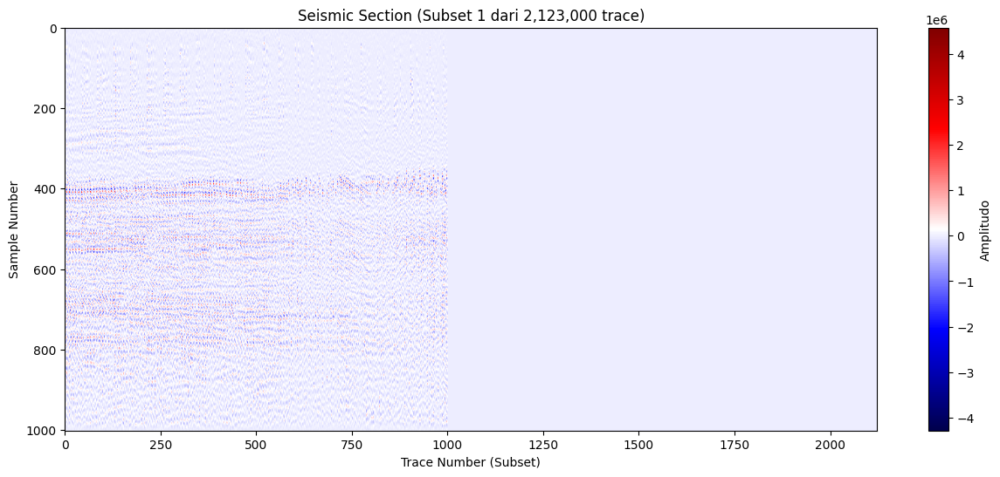

In [3]:
import segyio
import numpy as np
import matplotlib.pyplot as plt

def process_large_segy(file_path, max_traces=1000, skip=100):
    try:
        with segyio.open(file_path, "r", strict=False, ignore_geometry=True) as segyfile:
            print(f"File: {file_path}")
            print(f"Total Trace: {segyfile.tracecount:,}")
            print(f"Samples per Trace: {len(segyfile.samples)}")
            
            # Hitung kebutuhan memori
            trace_size = segyfile.tracecount * len(segyfile.samples) * 4  # 4 bytes untuk float32
            print(f"\nPerkiraan Ukuran Memori: {trace_size/1e9:.2f} GB")
            
            # Baca subset data dengan memory-mapping
            traces_to_read = range(0, segyfile.tracecount, skip)
            num_traces = len(traces_to_read)
            
            # Inisialisasi array dengan tipe data yang lebih efisien
            seismic_data = np.zeros((num_traces, len(segyfile.samples)), dtype=np.float32)
            
            print("\nMembaca data dengan pola:")
            print(f"- Melompati setiap {skip} trace")
            print(f"- Total trace yang diproses: {num_traces:,}")
            
            # Baca data per batch
            for i, idx in enumerate(traces_to_read):
                if i >= max_traces:  # Batasi untuk demo
                    break
                seismic_data[i] = segyfile.trace[idx]
                
                # Tampilkan progress
                if i % 100 == 0:
                    print(f"Proses: {i+1}/{num_traces} trace", end='\r')

            return seismic_data
            
    except Exception as e:
        print(f"\nError: {str(e)}")
        return None

# Eksekusi dengan parameter aman
file_path = "bandpass_filter.sgy"
data = process_large_segy(file_path, max_traces=1000, skip=1000)

if data is not None:
    # Visualisasi subset data
    plt.figure(figsize=(15, 6))
    plt.imshow(data.T, aspect='auto', cmap='seismic', 
              extent=[0, data.shape[0], data.shape[1], 0])
    plt.colorbar(label='Amplitudo')
    plt.title(f"Seismic Section (Subset 1 dari {data.shape[0]*1000:,} trace)")
    plt.xlabel("Trace Number (Subset)")
    plt.ylabel("Sample Number")
    plt.show()

In [4]:
def streaming_stats(file_path):
    try:
        with segyio.open(file_path, "r", strict=False, ignore_geometry=True) as segyfile:
            print("\nMenghitung statistik streaming:")
            
            max_val = -np.inf
            min_val = np.inf
            total = 0
            count = 0
            
            for i, trace in enumerate(segyfile.trace):
                current_max = np.nanmax(trace)
                current_min = np.nanmin(trace)
                
                if current_max > max_val:
                    max_val = current_max
                if current_min < min_val:
                    min_val = current_min
                
                total += np.nansum(trace)
                count += trace.size
                
                if i % 1000 == 0:
                    print(f"Proses: {i+1} trace", end='\r')

            mean = total / count
            print("\nHasil Statistik:")
            print(f"Maksimum: {max_val:.2f}")
            print(f"Minimum: {min_val:.2f}")
            print(f"Rata-rata: {mean:.2f}")
            
    except Exception as e:
        print(f"\nError: {str(e)}")

# Eksekusi analisis statistik
streaming_stats(file_path)


Menghitung statistik streaming:
Proses: 2122001 trace
Hasil Statistik:
Maksimum: 6320032.00
Minimum: -6989733.00
Rata-rata: -4.17


In [8]:
import segyio
import dask.array as da
import numpy as np
from dask import delayed

def read_segy_dask(file_path, chunk_size=1000):
    try:
        with segyio.open(file_path, "r", strict=False, ignore_geometry=True) as segyfile:
            num_traces = segyfile.tracecount
            num_samples = len(segyfile.samples)
            print(f"Total Trace: {num_traces:,}")
            print(f"Samples per Trace: {num_samples}")

            # Baca data dalam chunk dan konversi ke Dask array
            chunks = []
            for i in range(0, num_traces, chunk_size):
                end = min(i + chunk_size, num_traces)
                
                # Baca chunk dan konversi ke Dask array
                chunk = delayed(segyfile.trace.raw)(i, end)
                dask_chunk = da.from_delayed(chunk, shape=(end-i, num_samples), dtype=np.float32)
                chunks.append(dask_chunk)

            # Gabungkan semua chunk
            dask_array = da.concatenate(chunks, axis=0)
            return dask_array

    except Exception as e:
        print(f"\nError: {str(e)}")
        return None

# Gunakan fungsi
file_path = "bandpass_filter.sgy"
dask_data = read_segy_dask(file_path, chunk_size=10000)

if dask_data is not None:
    print("\nInformasi Dask Array:")
    print(f"Shape: {dask_data.shape}")
    print(f"Chunk Size: {dask_data.chunksize}")
    print(f"Tipe Data: {dask_data.dtype}")

Total Trace: 2,122,824
Samples per Trace: 1001

Informasi Dask Array:
Shape: (2122824, 1001)
Chunk Size: (10000, 1001)
Tipe Data: float32


File: bandpass_filter.sgy
Total Trace: 2,122,824
Samples per Trace: 1001

Perkiraan Ukuran Memori: 8.50 GB

Membaca data dengan pola:
- Melompati setiap 1 trace


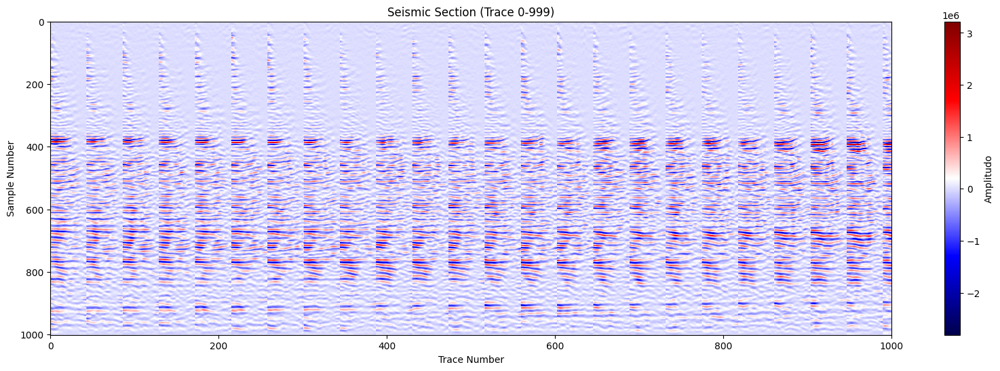

In [19]:
import segyio
import numpy as np
import matplotlib.pyplot as plt

def process_large_segy(file_path, max_traces=1000, skip=1):
    try:
        with segyio.open(file_path, "r", strict=False, ignore_geometry=True) as segyfile:
            print(f"File: {file_path}")
            print(f"Total Trace: {segyfile.tracecount:,}")
            print(f"Samples per Trace: {len(segyfile.samples)}")
            
            # Hitung kebutuhan memori
            trace_size = segyfile.tracecount * len(segyfile.samples) * 4  # 4 bytes untuk float32
            print(f"\nPerkiraan Ukuran Memori: {trace_size/1e9:.2f} GB")
            
            # Baca data dalam batch
            seismic_data = []
            traces_to_read = range(0, segyfile.tracecount, skip)
            
            print("\nMembaca data dengan pola:")
            print(f"- Melompati setiap {skip} trace")
            
            for i, idx in enumerate(traces_to_read):
                if i >= max_traces:  # Batasi untuk demo
                    break
                seismic_data.append(segyfile.trace[idx])
                
                # Tampilkan progress
                if i % 100 == 0:
                    print(f"Proses: {i+1}/{max_traces} trace", end='\r')

            return np.array(seismic_data)  # Kembalikan data sebagai array NumPy
            
    except Exception as e:
        print(f"\nError: {str(e)}")
        return None

# Eksekusi dengan parameter aman
file_path = "bandpass_filter.sgy"
data = process_large_segy(file_path, max_traces=1000, skip=1)  # Baca 1000 trace pertama

if data is not None:
    # Visualisasi data pada rentang 0-1000 trace
    plt.figure(figsize=(20, 6))
    plt.imshow(data.T, aspect='auto', cmap='seismic', 
               extent=[0, data.shape[0], data.shape[1], 0])  # Sumbu x: 0 hingga jumlah trace
    plt.colorbar(label='Amplitudo')
    plt.title(f"Seismic Section (Trace 0-{data.shape[0]-1})")  # Judul disesuaikan
    plt.xlabel("Trace Number")
    plt.ylabel("Sample Number")
    plt.xlim(0, 1000)  # Batasi sumbu x ke 0-1000
    plt.show()

File: cdp.sgy
Total Trace: 49,368
Samples per Trace: 1001

Perkiraan Ukuran Memori: 0.20 GB

Membaca data dengan pola:
- Melompati setiap 1 trace


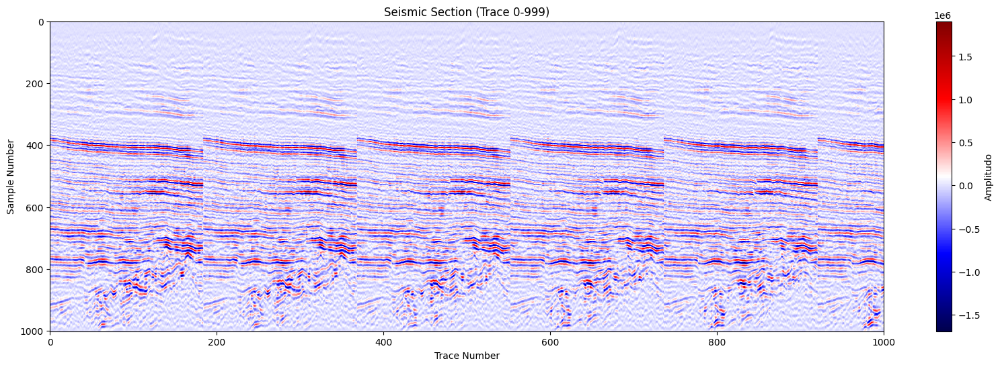

In [20]:
import segyio
import numpy as np
import matplotlib.pyplot as plt

def process_large_segy(file_path, max_traces=1000, skip=1):
    try:
        with segyio.open(file_path, "r", strict=False, ignore_geometry=True) as segyfile:
            print(f"File: {file_path}")
            print(f"Total Trace: {segyfile.tracecount:,}")
            print(f"Samples per Trace: {len(segyfile.samples)}")
            
            # Hitung kebutuhan memori
            trace_size = segyfile.tracecount * len(segyfile.samples) * 4  # 4 bytes untuk float32
            print(f"\nPerkiraan Ukuran Memori: {trace_size/1e9:.2f} GB")
            
            # Baca data dalam batch
            seismic_data = []
            traces_to_read = range(0, segyfile.tracecount, skip)
            
            print("\nMembaca data dengan pola:")
            print(f"- Melompati setiap {skip} trace")
            
            for i, idx in enumerate(traces_to_read):
                if i >= max_traces:  # Batasi untuk demo
                    break
                seismic_data.append(segyfile.trace[idx])
                
                # Tampilkan progress
                if i % 100 == 0:
                    print(f"Proses: {i+1}/{max_traces} trace", end='\r')

            return np.array(seismic_data)  # Kembalikan data sebagai array NumPy
            
    except Exception as e:
        print(f"\nError: {str(e)}")
        return None

# Eksekusi dengan parameter aman
file_path = "cdp.sgy"
data = process_large_segy(file_path, max_traces=1000, skip=1)  # Baca 1000 trace pertama

if data is not None:
    # Visualisasi data pada rentang 0-1000 trace
    plt.figure(figsize=(20, 6))
    plt.imshow(data.T, aspect='auto', cmap='seismic', 
               extent=[0, data.shape[0], data.shape[1], 0])  # Sumbu x: 0 hingga jumlah trace
    plt.colorbar(label='Amplitudo')
    plt.title(f"Seismic Section (Trace 0-{data.shape[0]-1})")  # Judul disesuaikan
    plt.xlabel("Trace Number")
    plt.ylabel("Sample Number")
    plt.xlim(0, 1000)  # Batasi sumbu x ke 0-1000
    plt.show()

File: cdp.sgy
Total Trace: 49,368
Samples per Trace: 1001

Membaca data dengan pola:
- Melompati setiap 1 trace


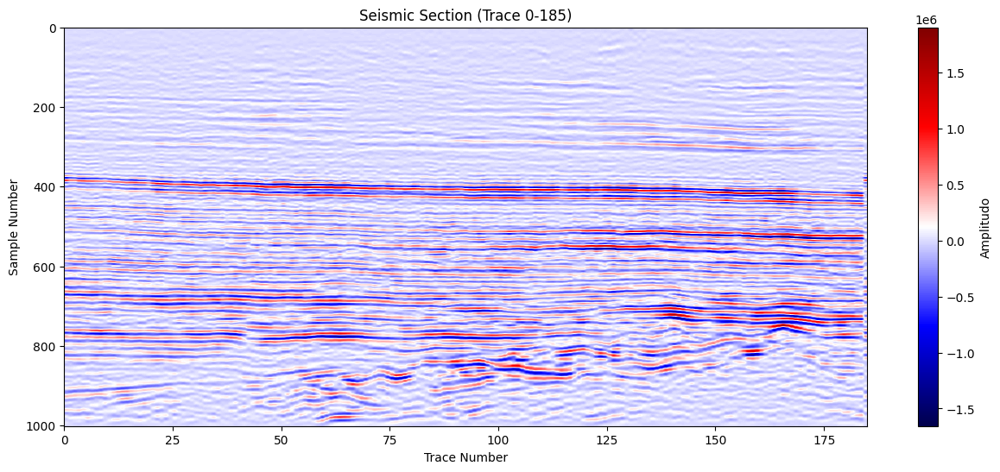

In [22]:
import segyio
import numpy as np
import matplotlib.pyplot as plt

def process_large_segy(file_path, max_traces=186, skip=1):  # Baca 186 trace (0-185)
    try:
        with segyio.open(file_path, "r", strict=False, ignore_geometry=True) as segyfile:
            print(f"File: {file_path}")
            print(f"Total Trace: {segyfile.tracecount:,}")
            print(f"Samples per Trace: {len(segyfile.samples)}")
            
            # Baca data dalam batch
            seismic_data = []
            traces_to_read = range(0, segyfile.tracecount, skip)
            
            print("\nMembaca data dengan pola:")
            print(f"- Melompati setiap {skip} trace")
            
            for i, idx in enumerate(traces_to_read):
                if i >= max_traces:  # Hentikan setelah 186 trace
                    break
                seismic_data.append(segyfile.trace[idx])
                
                # Tampilkan progress
                if i % 10 == 0:
                    print(f"Proses: {i+1}/{max_traces} trace", end='\r')

            return np.array(seismic_data)  # Kembalikan data sebagai array NumPy
            
    except Exception as e:
        print(f"\nError: {str(e)}")
        return None

# Eksekusi dengan parameter khusus
file_path = "cdp.sgy"
data = process_large_segy(file_path, max_traces=186, skip=1)  # Baca 186 trace pertama (0-185)

if data is not None:
    # Visualisasi data pada rentang 0-185 trace
    plt.figure(figsize=(15, 6))
    plt.imshow(data.T, aspect='auto', cmap='seismic', 
               extent=[0, data.shape[0], data.shape[1], 0])  # Sumbu x: 0-185
    plt.colorbar(label='Amplitudo')
    plt.title("Seismic Section (Trace 0-185)")
    plt.xlabel("Trace Number")
    plt.ylabel("Sample Number")
    plt.xlim(0, 185)  # Batasi sumbu x ke 0-185
    plt.show()

File: cdp.sgy
Total Trace: 49,368
Samples per Trace: 1001


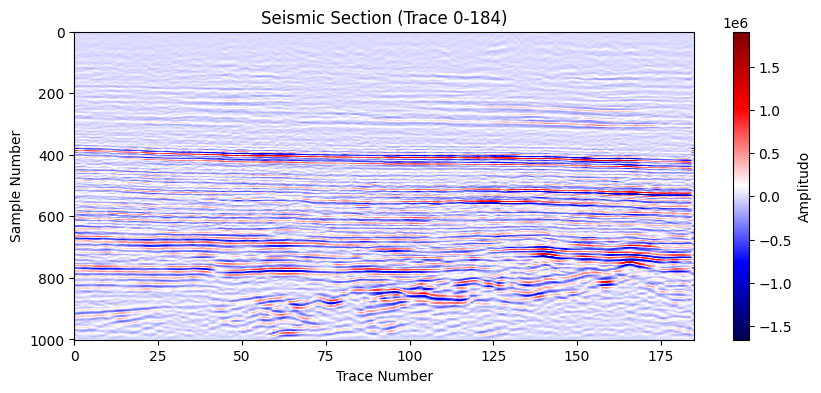

File: cdp.sgy
Total Trace: 49,368
Samples per Trace: 1001


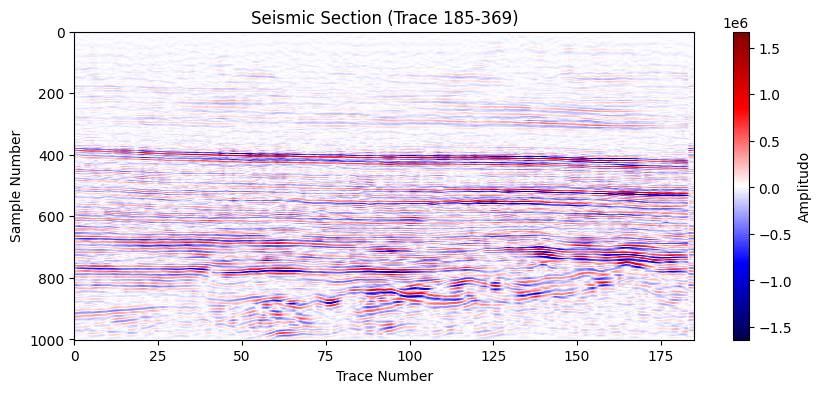

File: cdp.sgy
Total Trace: 49,368
Samples per Trace: 1001


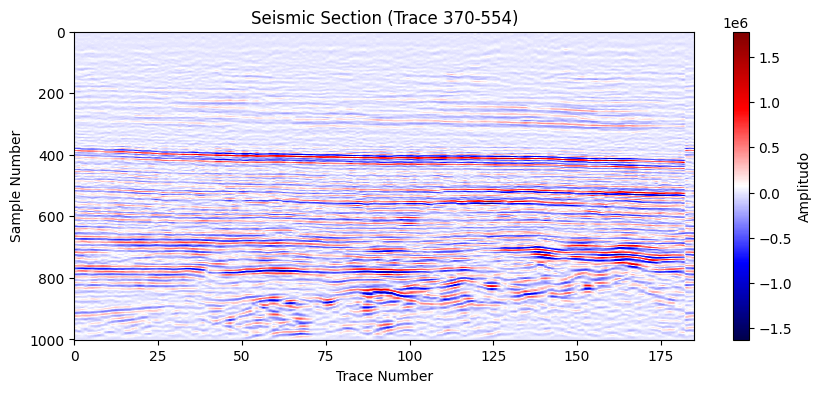

File: cdp.sgy
Total Trace: 49,368
Samples per Trace: 1001


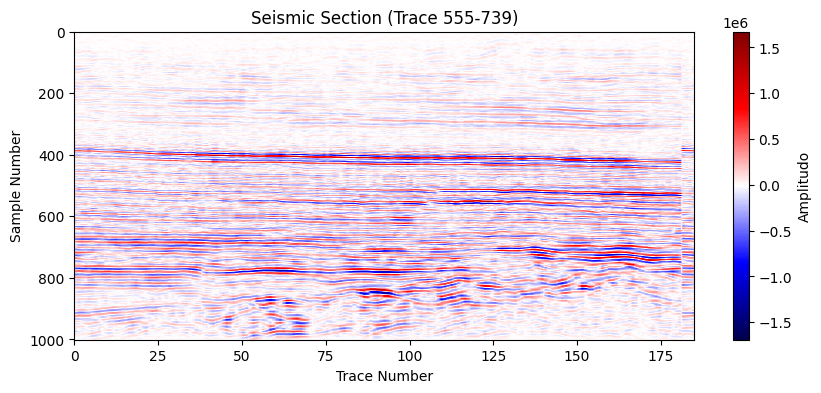

File: cdp.sgy
Total Trace: 49,368
Samples per Trace: 1001


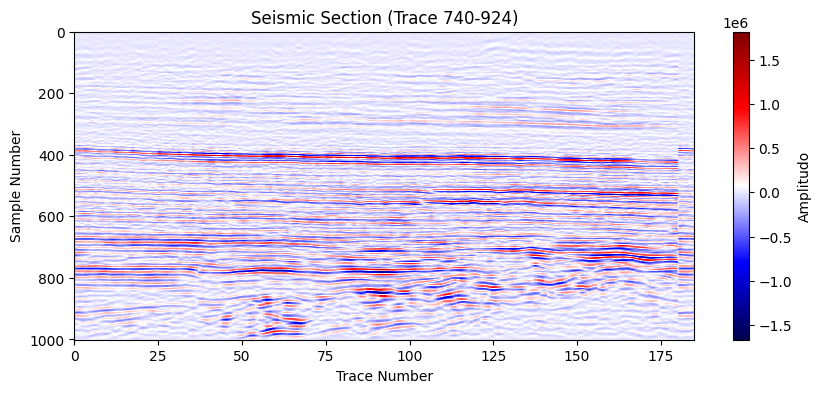

File: cdp.sgy
Total Trace: 49,368
Samples per Trace: 1001


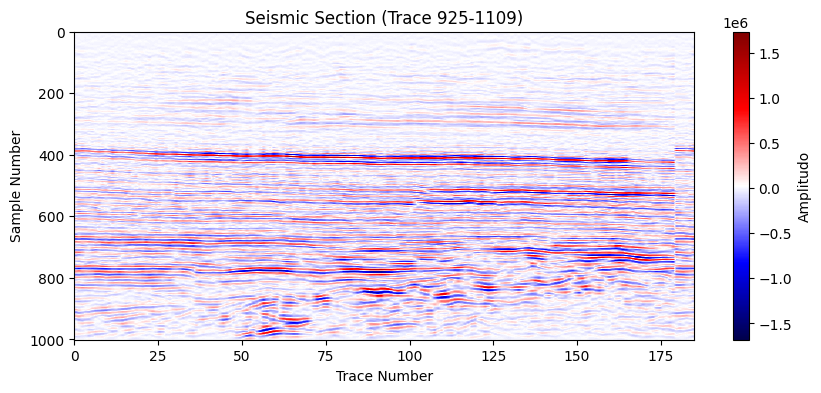

File: cdp.sgy
Total Trace: 49,368
Samples per Trace: 1001


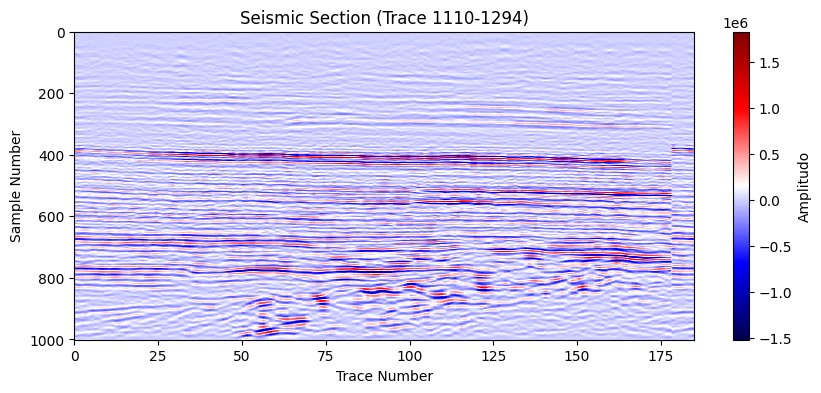

File: cdp.sgy
Total Trace: 49,368
Samples per Trace: 1001


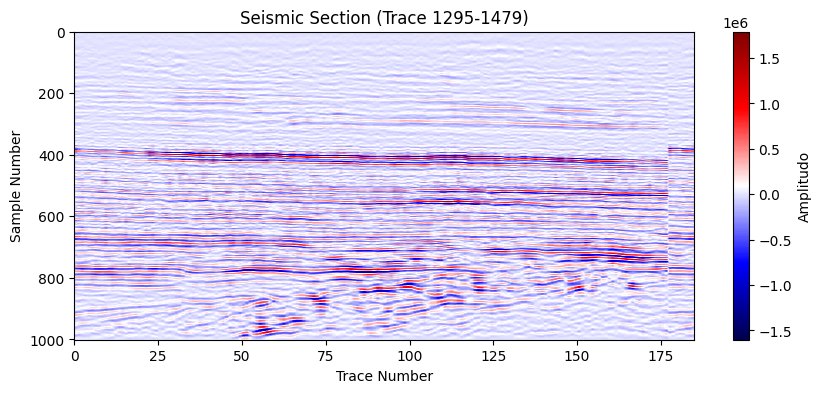

File: cdp.sgy
Total Trace: 49,368
Samples per Trace: 1001


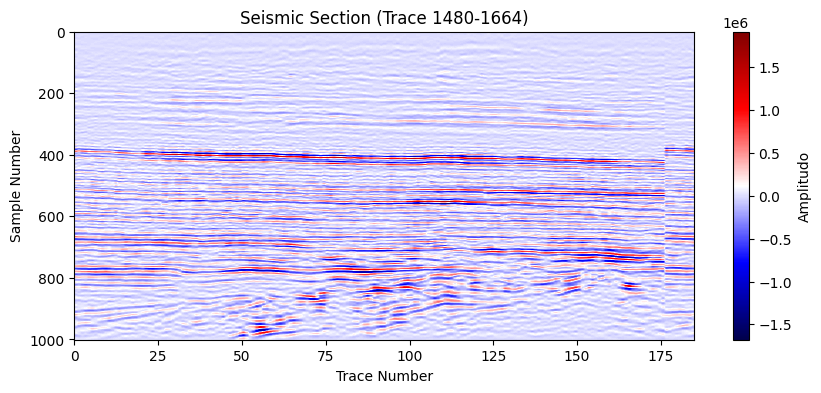

File: cdp.sgy
Total Trace: 49,368
Samples per Trace: 1001


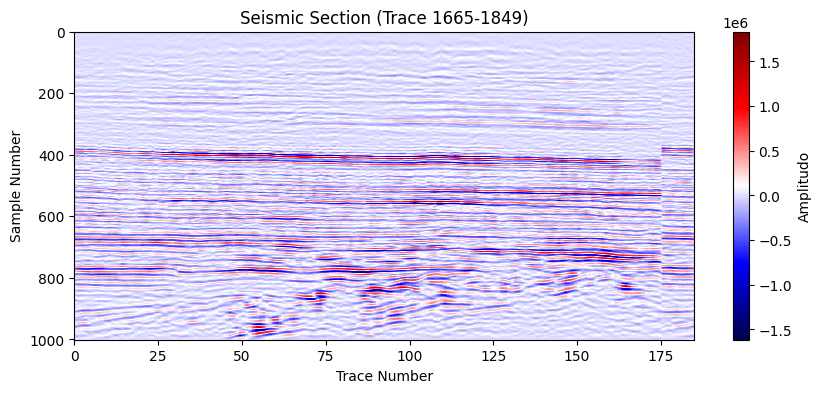

In [24]:
import segyio
import numpy as np
import matplotlib.pyplot as plt

def process_large_segy(file_path, start_trace, end_trace):
    try:
        with segyio.open(file_path, "r", strict=False, ignore_geometry=True) as segyfile:
            print(f"File: {file_path}")
            print(f"Total Trace: {segyfile.tracecount:,}")
            print(f"Samples per Trace: {len(segyfile.samples)}")
            
            # Baca data untuk rentang trace tertentu
            seismic_data = []
            for idx in range(start_trace, end_trace):
                if idx >= segyfile.tracecount:  # Pastikan tidak melebihi total trace
                    break
                seismic_data.append(segyfile.trace[idx])
                
            return np.array(seismic_data)  # Kembalikan data sebagai array NumPy
            
    except Exception as e:
        print(f"\nError: {str(e)}")
        return None

# Eksekusi untuk menampilkan 10 gambar
file_path = "cdp.sgy"
num_images = 10
trace_per_image = 185

for i in range(num_images):
    start_trace = i * trace_per_image
    end_trace = start_trace + trace_per_image
    
    data = process_large_segy(file_path, start_trace, end_trace)  # Baca rentang trace

    if data is not None:
        # Visualisasi data
        plt.figure(figsize=(10, 4))
        plt.imshow(data.T, aspect='auto', cmap='seismic', 
                   extent=[0, data.shape[0], data.shape[1], 0])  # Sumbu x: 0 hingga jumlah trace
        plt.colorbar(label='Amplitudo')
        plt.title(f"Seismic Section (Trace {start_trace}-{end_trace-1})")
        plt.xlabel("Trace Number")
        plt.ylabel("Sample Number")
        plt.xlim(0, trace_per_image)  # Batasi sumbu x ke 0-185
        plt.show()

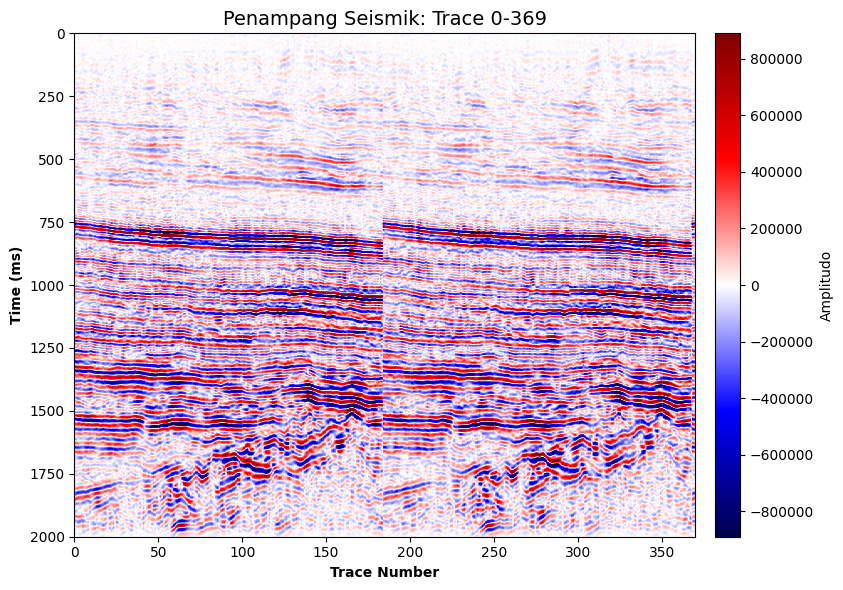

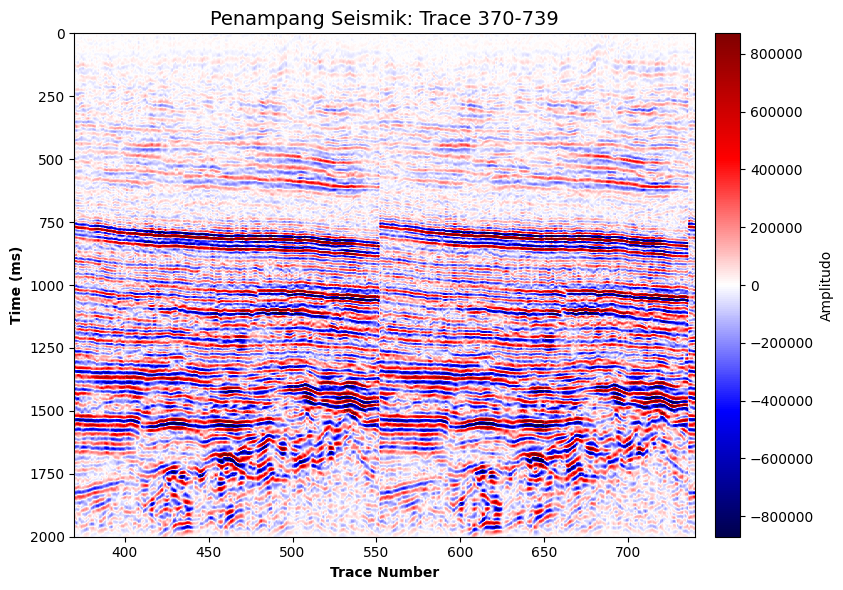

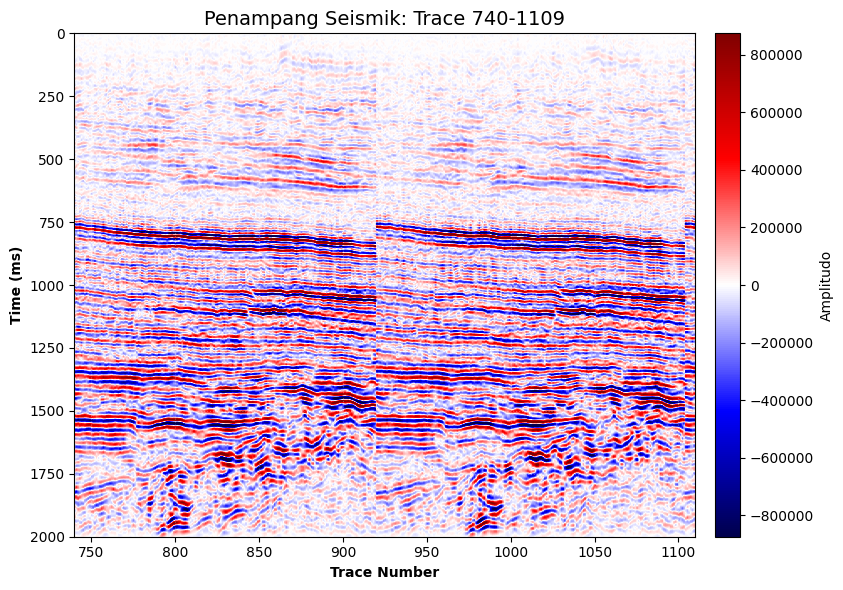

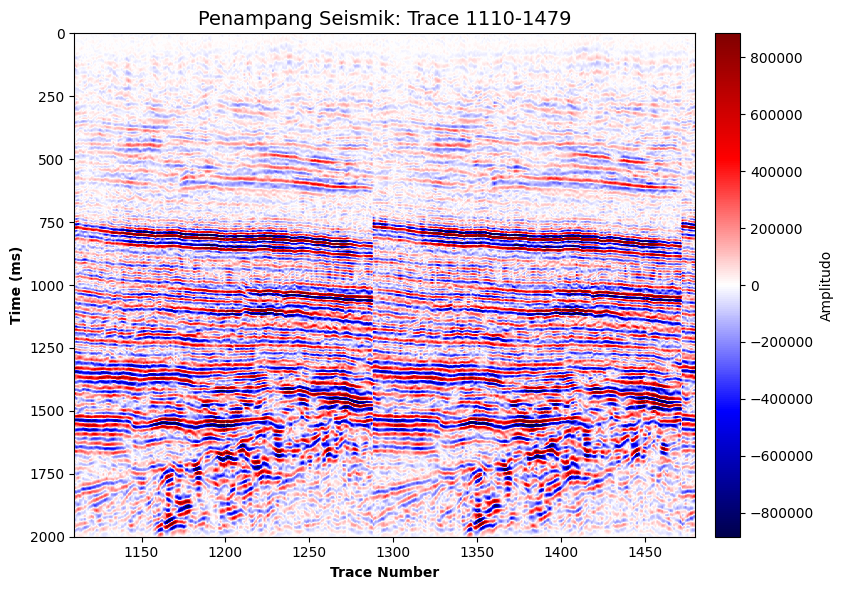

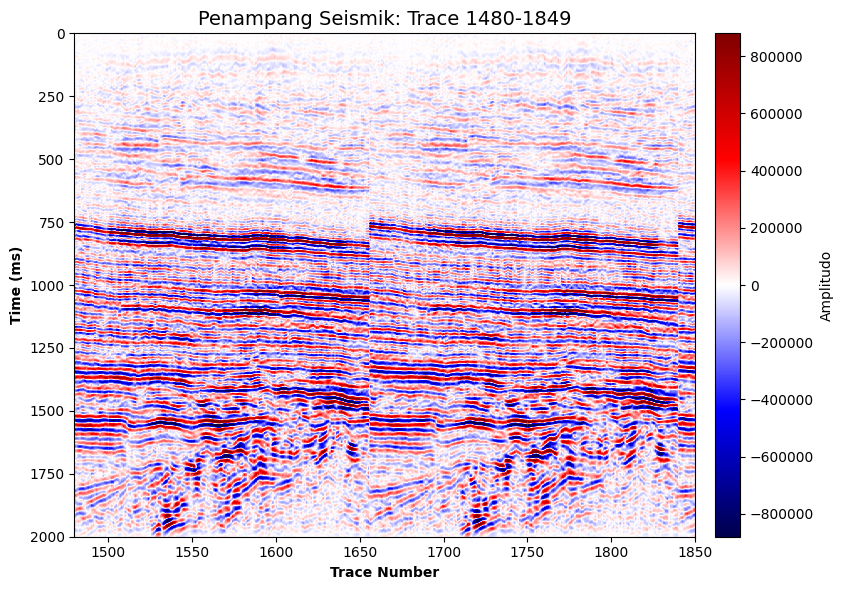

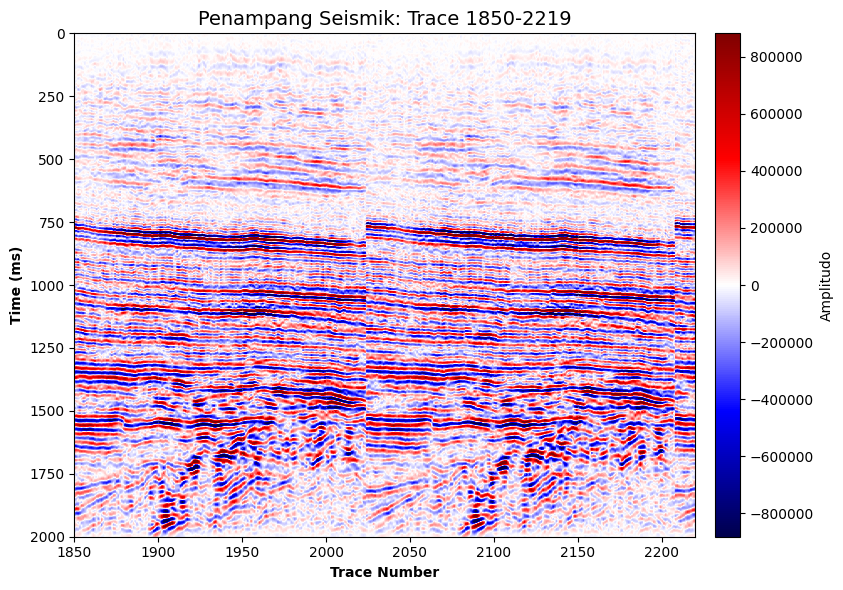

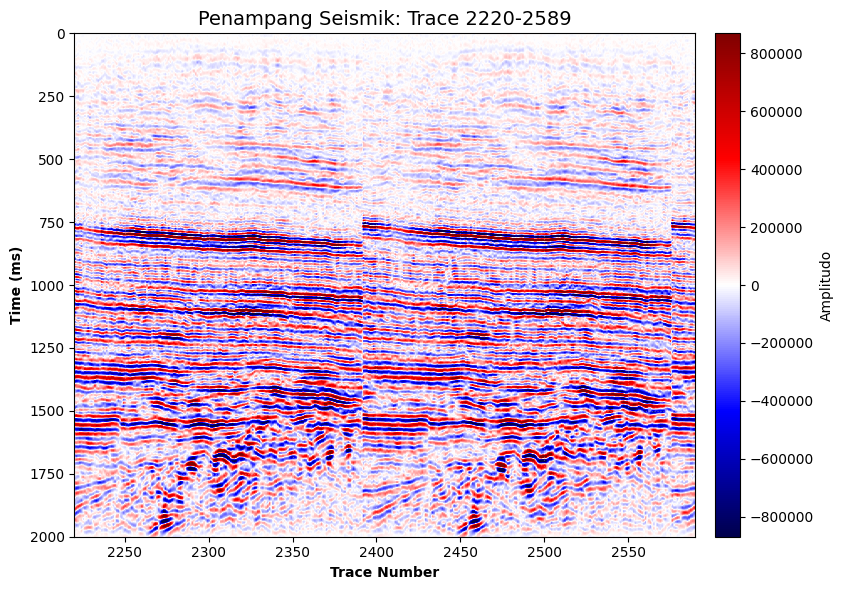

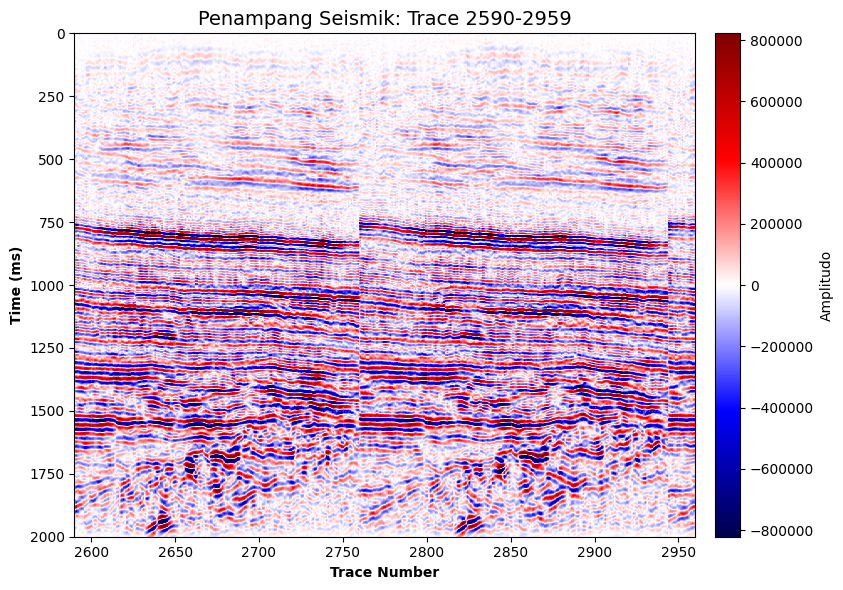

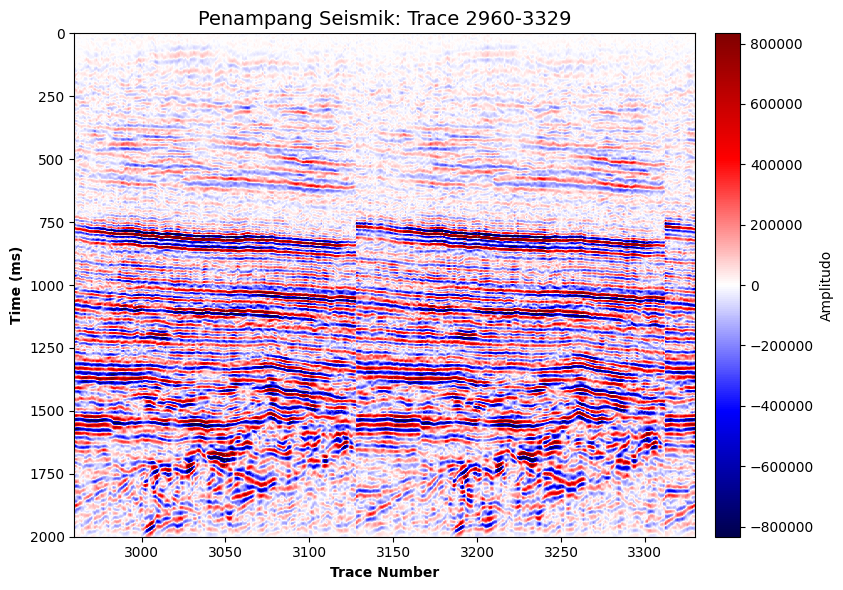

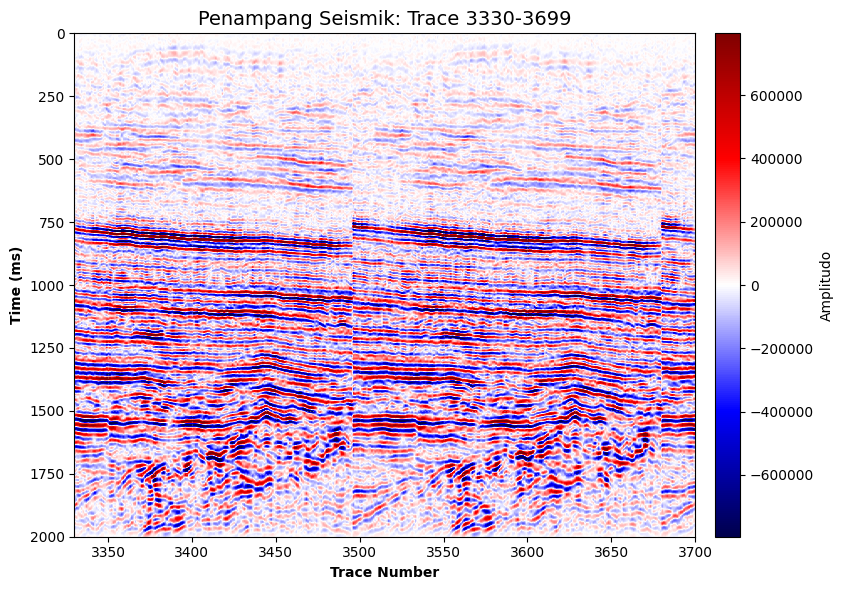

In [16]:
import segyio
import numpy as np
import matplotlib.pyplot as plt

def process_segy_chunk(file_path, start_trace, end_trace):
    try:
        with segyio.open(file_path, "r", strict=False, ignore_geometry=True) as segyfile:
            end_trace = min(end_trace, segyfile.tracecount)
            
            # Baca 370 trace per batch
            seismic_data = np.array([segyfile.trace[idx] for idx in range(start_trace, end_trace)])
            
            return seismic_data.T  # Transpose untuk orientasi vertikal
            
    except Exception as e:
        print(f"Error: {str(e)}")
        return None

# Parameter utama
file_path = "cdp.sgy"
total_images = 10
traces_per_image = 370  # <-- Diubah ke 370 trace/gambar

# Baca metadata file
with segyio.open(file_path, "r", ignore_geometry=True) as segyfile:
    total_traces = segyfile.tracecount
    sample_interval = segyio.tools.dt(segyfile) / 1000  # dalam ms

for i in range(total_images):
    start = i * traces_per_image
    end = start + traces_per_image
    data = process_segy_chunk(file_path, start, end)
    
    if data is not None and data.size > 0:
        samples = np.arange(data.shape[0]) * sample_interval
        
        # Visualisasi dengan penyesuaian untuk 370 trace
        plt.figure(figsize=(20, 6))  # Lebar gambar ditambah
        plt.imshow(data,
                 aspect=0.15,  # Aspect ratio lebih kecil untuk 370 trace
                 cmap='seismic',
                 vmin=-np.percentile(np.abs(data), 99),
                 vmax=np.percentile(np.abs(data), 99),
                 extent=[start, end, samples[-1], samples[0]])
        
        plt.colorbar(label='Amplitudo', pad=0.01)
        plt.title(f"Penampang Seismik: Trace {start}-{min(end, total_traces)-1}", fontsize=14)
        plt.xlabel("Trace Number", fontweight='bold')
        plt.ylabel("Time (ms)", fontweight='bold')
        plt.grid(linestyle=':', color='white', alpha=0.3)
        plt.tight_layout()
        plt.show()

In [19]:
import segyio
import numpy as np
import matplotlib.pyplot as plt

def process_segy_chunk(file_path, start_trace, end_trace):
    try:
        with segyio.open(file_path, "r", strict=False, ignore_geometry=True) as segyfile:
            end_trace = min(end_trace, segyfile.tracecount)
            # Convert the generator to a NumPy array
            return np.array([segyfile.trace[idx] for idx in range(start_trace, end_trace)])
    except Exception as e:
        print(f"Error: {str(e)}")
        return None

# Parameter
file_path = "cdp.sgy"
traces_per_image = 180  # Interval 180 trace per gambar
fig_width = 12  # Lebar gambar diperkecil
fig_height = 3  # Tinggi gambar diperkecil

# Baca metadata
with segyio.open(file_path, "r", ignore_geometry=True) as segyfile:
    total_traces = segyfile.tracecount
    sample_interval = segyio.tools.dt(segyfile) / 1000  # ms
    samples = segyfile.samples

# Hitung jumlah gambar yang diperlukan
total_images = (total_traces + traces_per_image - 1) // traces_per_image

# Generate semua gambar
for i in range(total_images):
    start = i * traces_per_image
    end = start + traces_per_image
    data = process_segy_chunk(file_path, start, end)
    
    if data is not None and data.size > 0:  # Use data.size instead of len(data)
        data = data.T  # Transpose untuk orientasi vertikal
        
        # Visualisasi kompak
        plt.figure(figsize=(fig_width, fig_height))
        plt.imshow(data,
                 aspect=0.05,  # Aspect ratio sangat kecil untuk kompresi horizontal
                 cmap='seismic',
                 vmin=-np.percentile(np.abs(data), 99),
                 vmax=np.percentile(np.abs(data), 99),
                 extent=[start, end, samples[-1], samples[0]])
        
        plt.colorbar(label='Amplitudo', fraction=0.02, pad=0.01)
        plt.title(f"Trace {start}-{min(end, total_traces)-1}")
        plt.xlabel("Trace Number")
        plt.ylabel("TWT (ms)")
        plt.grid(alpha=0.2)
        plt.tight_layout()
        
        # Simpan sebagai file terpisah
        plt.savefig(f"seismic_chunk_{i+1}.png", dpi=200, bbox_inches='tight')
        plt.close()  # Penting untuk manajemen memori

print(f"Generated {total_images} images!")

Generated 275 images!


Intercept: 34.34023666381836
Gradien: -0.0005604081088677049
R-squared: -2.777576446533203e-05


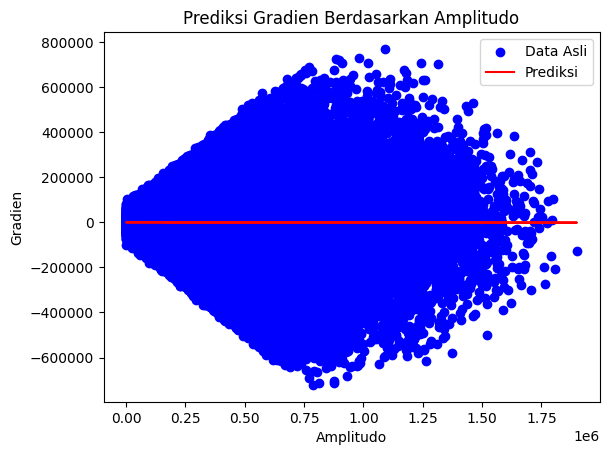

In [2]:
import segyio
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

def process_segy_chunk(file_path, start_trace, end_trace):
    try:
        with segyio.open(file_path, "r", strict=False, ignore_geometry=True) as segyfile:
            end_trace = min(end_trace, segyfile.tracecount)
            
            # Baca 370 trace per batch
            seismic_data = np.array([segyfile.trace[idx] for idx in range(start_trace, end_trace)])
            
            return seismic_data.T  # Transpose untuk orientasi vertikal
            
    except Exception as e:
        print(f"Error: {str(e)}")
        return None

# Parameter utama
file_path = "cdp.sgy"
total_images = 10
traces_per_image = 370  # Diubah ke 370 trace/gambar

# Baca metadata file
with segyio.open(file_path, "r", ignore_geometry=True) as segyfile:
    total_traces = segyfile.tracecount
    sample_interval = segyio.tools.dt(segyfile) / 1000  # dalam ms

# Menyimpan data untuk analisis
all_amplitudo = []
all_gradien = []

for i in range(total_images):
    start = i * traces_per_image
    end = start + traces_per_image
    data = process_segy_chunk(file_path, start, end)
    
    if data is not None and data.size > 0:
        # Menghitung amplitudo dan gradien
        amplitudo = np.abs(data)
        gradien = np.gradient(amplitudo, axis=0)  # Menghitung gradien sepanjang waktu
        
        # Menyimpan amplitudo dan gradien
        all_amplitudo.append(amplitudo)
        all_gradien.append(gradien)

# Menggabungkan semua data
all_amplitudo = np.concatenate(all_amplitudo, axis=0)
all_gradien = np.concatenate(all_gradien, axis=0)

# Membuat DataFrame untuk analisis lebih lanjut
data = pd.DataFrame({'amplitudo': all_amplitudo.flatten(), 'gradien': all_gradien.flatten()})

# Membagi data menjadi set pelatihan dan set pengujian
X = data[['amplitudo']]  # Fitur
y = data['gradien']      # Target

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Membuat dan melatih model regresi linier
model = LinearRegression()
model.fit(X_train, y_train)

# Mengambil nilai intercept dan gradien
intercept = model.intercept_
gradien = model.coef_[0]

print(f'Intercept: {intercept}')
print(f'Gradien: {gradien}')

# Evaluasi model menggunakan data pengujian
y_pred = model.predict(X_test)

# Menghitung R-squared
r2 = r2_score(y_test, y_pred)
print(f'R-squared: {r2}')

# Visualisasi hasil
plt.scatter(X_test, y_test, color='blue', label='Data Asli')
plt.plot(X_test, y_pred, color='red', label='Prediksi')
plt.xlabel('Amplitudo')
plt.ylabel('Gradien')
plt.legend()
plt.title('Prediksi Gradien Berdasarkan Amplitudo')
plt.show()

In [10]:
import lasio
import pandas as pd

# Membaca file LAS
file_path = "MSBF-01.las"  # Ganti dengan path lengkap jika perlu
las = lasio.read(file_path)

# Mengonversi data dari curve menjadi DataFrame
data_dict = {curve.mnemonic: curve.data for curve in las.curves}
df = pd.DataFrame(data_dict)

# Menyimpan DataFrame ke dalam file CSV
csv_file_path = "MSBF-01.csv"  # Nama file CSV yang akan disimpan
df.to_csv(csv_file_path, index=False)

print(f"Data telah disimpan ke {csv_file_path}")

Data telah disimpan ke MSBF-01.csv


File: bandpass_filter.sgy
Total Trace: 2,122,824
Samples per Trace: 1001

Membaca data dengan pola:
- Melompati setiap 1 trace


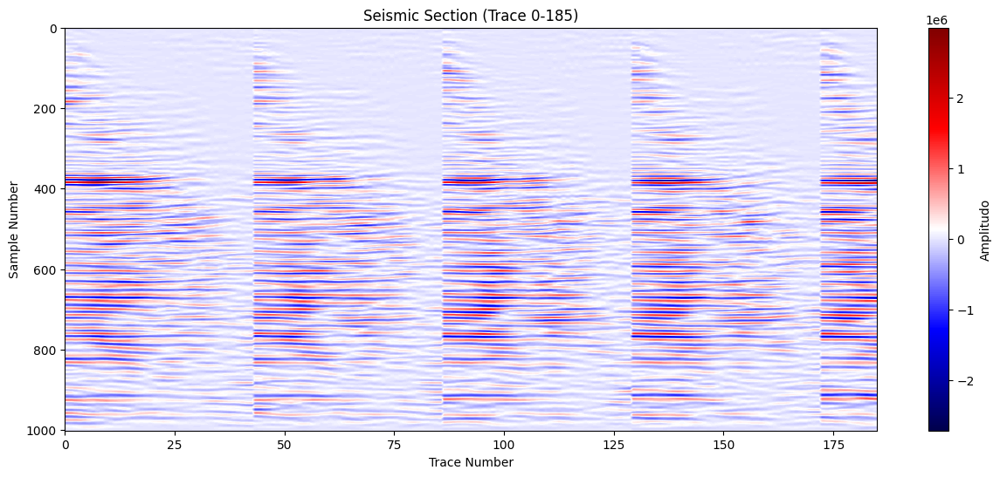

In [1]:
import segyio
import numpy as np
import matplotlib.pyplot as plt

def process_large_segy(file_path, max_traces=186, skip=1):  # Baca 186 trace (0-185)
    try:
        with segyio.open(file_path, "r", strict=False, ignore_geometry=True) as segyfile:
            print(f"File: {file_path}")
            print(f"Total Trace: {segyfile.tracecount:,}")
            print(f"Samples per Trace: {len(segyfile.samples)}")
            
            # Baca data dalam batch
            seismic_data = []
            traces_to_read = range(0, segyfile.tracecount, skip)
            
            print("\nMembaca data dengan pola:")
            print(f"- Melompati setiap {skip} trace")
            
            for i, idx in enumerate(traces_to_read):
                if i >= max_traces:  # Hentikan setelah 186 trace
                    break
                seismic_data.append(segyfile.trace[idx])
                
                # Tampilkan progress
                if i % 10 == 0:
                    print(f"Proses: {i+1}/{max_traces} trace", end='\r')

            return np.array(seismic_data)  # Kembalikan data sebagai array NumPy
            
    except Exception as e:
        print(f"\nError: {str(e)}")
        return None

# Eksekusi dengan parameter khusus
file_path = "bandpass_filter.sgy"
data = process_large_segy(file_path, max_traces=186, skip=1)  # Baca 186 trace pertama (0-185)

if data is not None:
    # Visualisasi data pada rentang 0-185 trace
    plt.figure(figsize=(15, 6))
    plt.imshow(data.T, aspect='auto', cmap='seismic', 
               extent=[0, data.shape[0], data.shape[1], 0])  # Sumbu x: 0-185
    plt.colorbar(label='Amplitudo')
    plt.title("Seismic Section (Trace 0-185)")
    plt.xlabel("Trace Number")
    plt.ylabel("Sample Number")
    plt.xlim(0, 185)  # Batasi sumbu x ke 0-185
    plt.show()

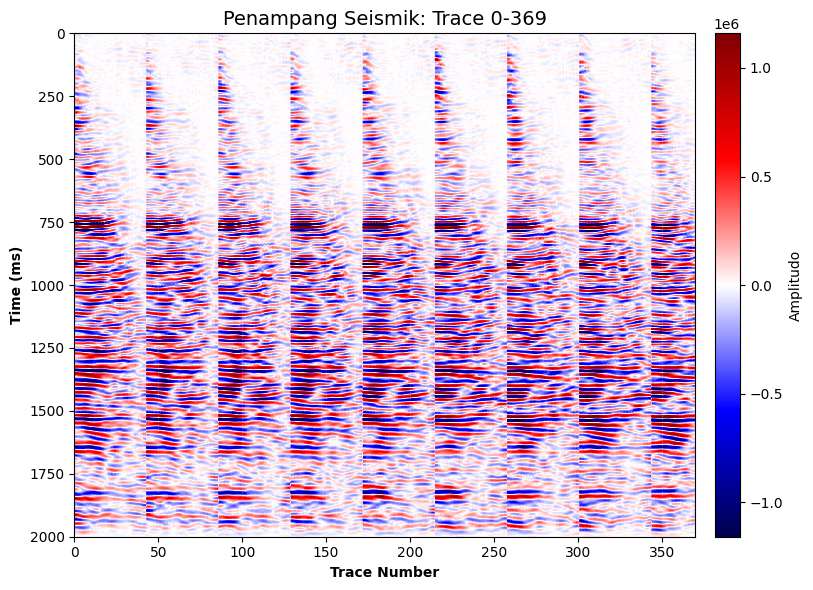

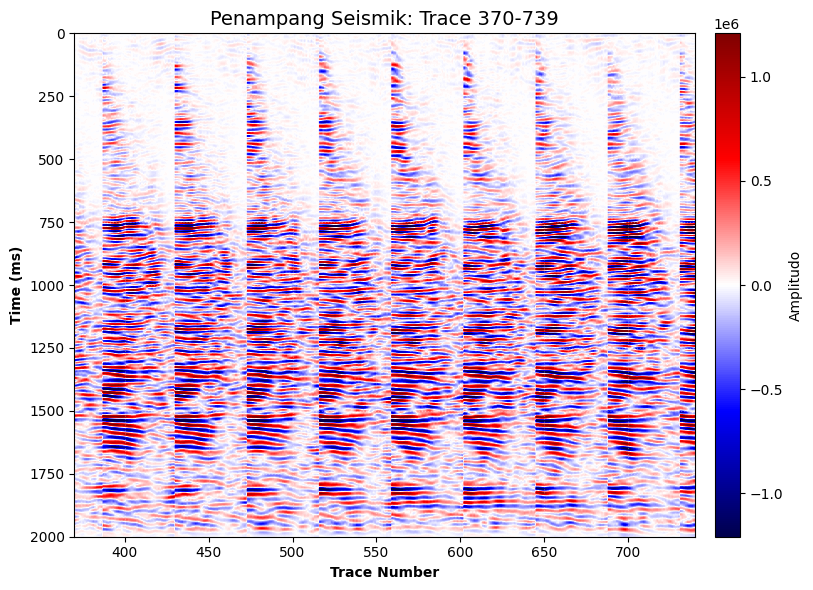

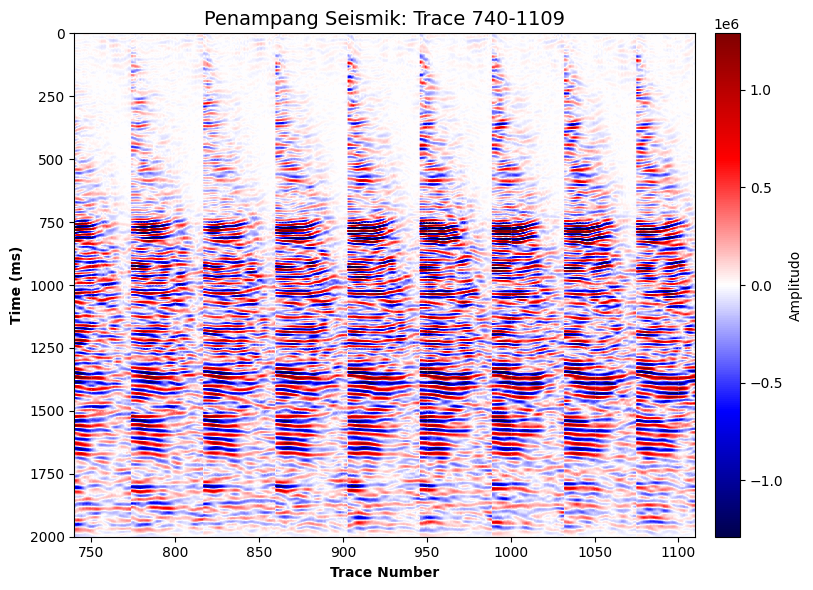

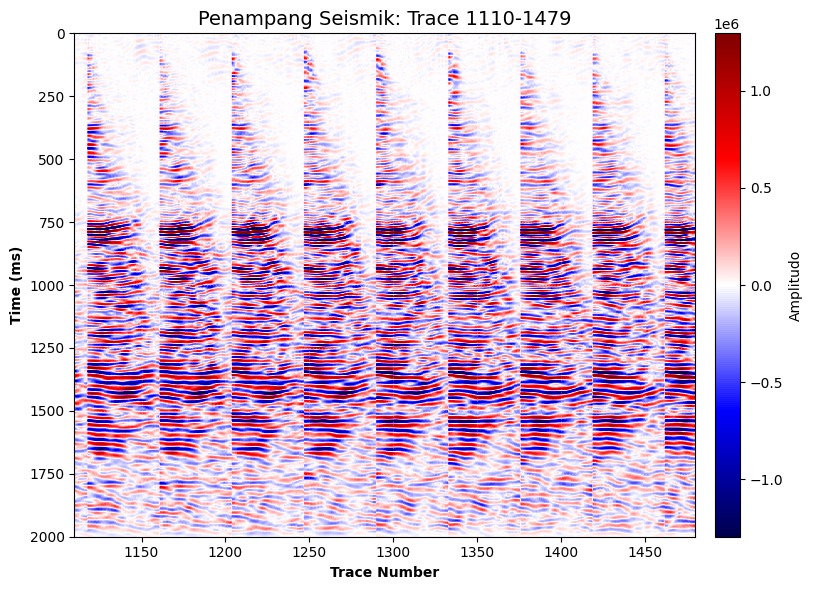

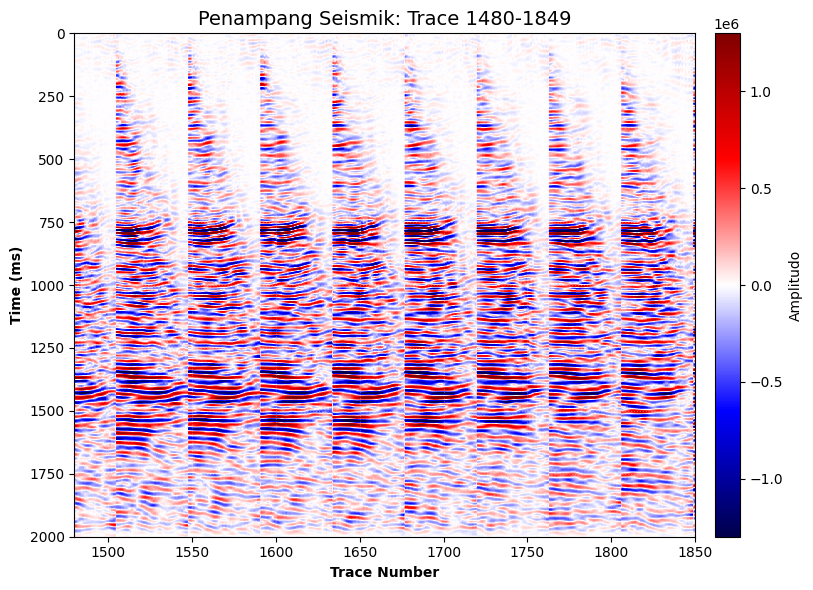

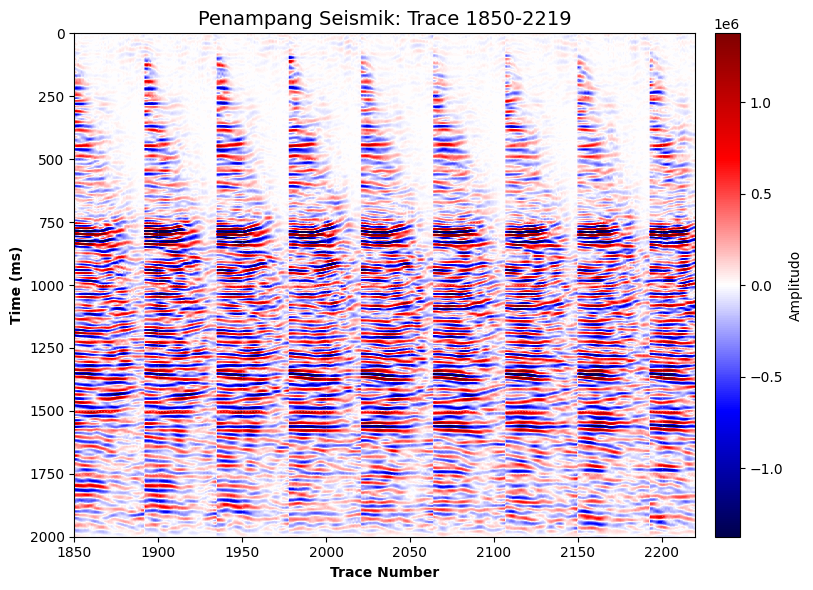

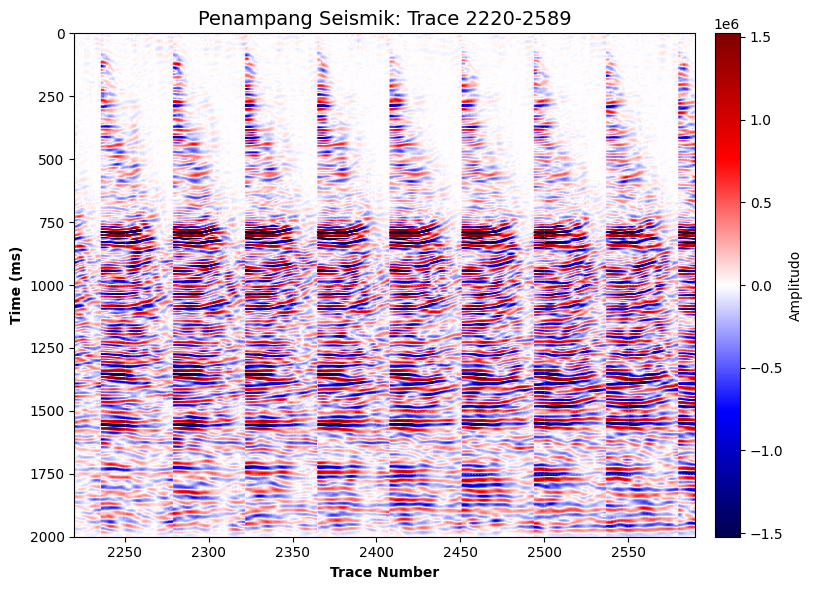

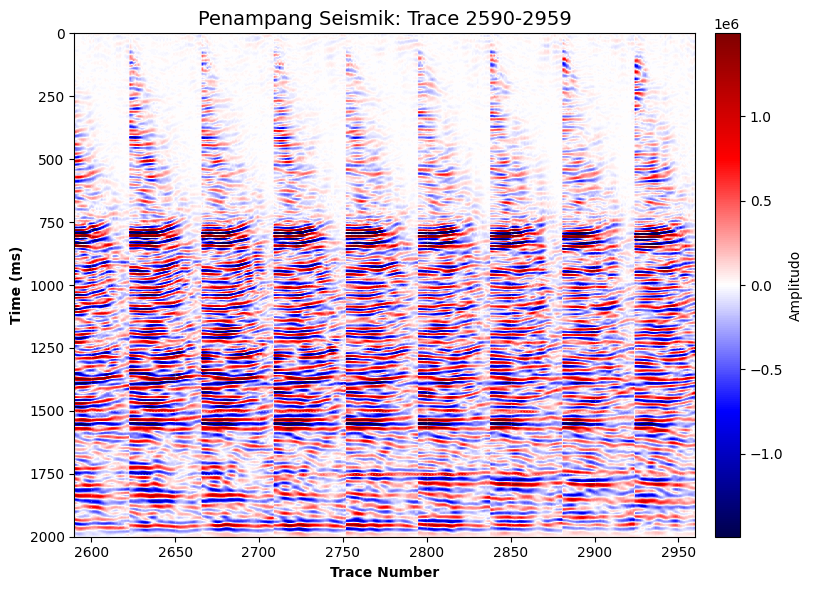

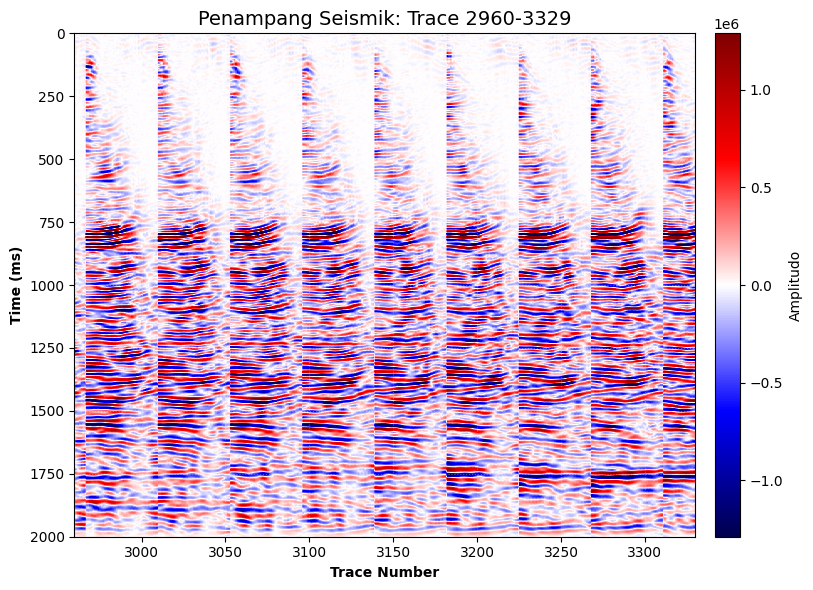

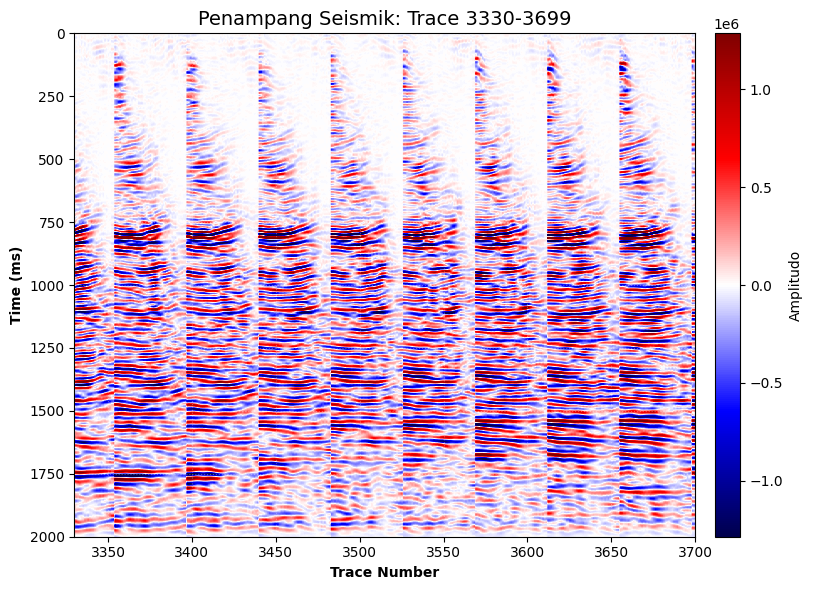

In [2]:
import segyio
import numpy as np
import matplotlib.pyplot as plt

def process_segy_chunk(file_path, start_trace, end_trace):
    try:
        with segyio.open(file_path, "r", strict=False, ignore_geometry=True) as segyfile:
            end_trace = min(end_trace, segyfile.tracecount)
            
            # Baca 370 trace per batch
            seismic_data = np.array([segyfile.trace[idx] for idx in range(start_trace, end_trace)])
            
            return seismic_data.T  # Transpose untuk orientasi vertikal
            
    except Exception as e:
        print(f"Error: {str(e)}")
        return None

# Parameter utama
file_path = "bandpass_filter.sgy"
total_images = 10
traces_per_image = 370  # <-- Diubah ke 370 trace/gambar

# Baca metadata file
with segyio.open(file_path, "r", ignore_geometry=True) as segyfile:
    total_traces = segyfile.tracecount
    sample_interval = segyio.tools.dt(segyfile) / 1000  # dalam ms

for i in range(total_images):
    start = i * traces_per_image
    end = start + traces_per_image
    data = process_segy_chunk(file_path, start, end)
    
    if data is not None and data.size > 0:
        samples = np.arange(data.shape[0]) * sample_interval
        
        # Visualisasi dengan penyesuaian untuk 370 trace
        plt.figure(figsize=(20, 6))  # Lebar gambar ditambah
        plt.imshow(data,
                 aspect=0.15,  # Aspect ratio lebih kecil untuk 370 trace
                 cmap='seismic',
                 vmin=-np.percentile(np.abs(data), 99),
                 vmax=np.percentile(np.abs(data), 99),
                 extent=[start, end, samples[-1], samples[0]])
        
        plt.colorbar(label='Amplitudo', pad=0.01)
        plt.title(f"Penampang Seismik: Trace {start}-{min(end, total_traces)-1}", fontsize=14)
        plt.xlabel("Trace Number", fontweight='bold')
        plt.ylabel("Time (ms)", fontweight='bold')
        plt.grid(linestyle=':', color='white', alpha=0.3)
        plt.tight_layout()
        plt.show()